In [1]:
!wget --header="Host: storage.googleapis.com" --header="User-Agent: Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/78.0.3904.108 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header="Accept-Language: en-GB,en-US;q=0.9,en;q=0.8" --header="Referer: https://www.kaggle.com/" "https://storage.googleapis.com/kagglesdsdata/datasets/36674/55880/Indian_Number_plates.json?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1575899280&Signature=pfqwJEhrAlwOVOclYCDODMMHBN8S9OO5PFhp0D9WOiX%2FT%2Bfm8x%2BzOFNGD7Iw%2BV%2BqCKHrh%2Bq769FGFP8%2BlvfK8alwQicZDoNj3NvDmoGFH6IgDsRKoWNtZfuYMrkOdbxs4%2FIAKm4ZlyR9uxUxnCbKTOA3RAKbdZL0%2BflDBUXcO%2F8LLuVoYVS5ff7QVc%2B8G1Qjt1JTv2mGfpIctRSW3UfyhsU%2BQelptCDhS1NxQmjJm7V3pHkUtdM4sTohrSQs7feXPKcHRaWH2EpFy0xKG7T5aXpXFhwFwIaiUJtxRlwSxAaeom3ne4a8XO5hNM%2BL5ljM4Tva0yhEf%2FZsXGEcMULekQ%3D%3D&response-content-disposition=attachment%3B+filename%3DIndian_Number_plates.json" -O "Indian_Number_plates.json" -c

--2019-12-06 13:54:35--  https://storage.googleapis.com/kagglesdsdata/datasets/36674/55880/Indian_Number_plates.json?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1575899280&Signature=pfqwJEhrAlwOVOclYCDODMMHBN8S9OO5PFhp0D9WOiX%2FT%2Bfm8x%2BzOFNGD7Iw%2BV%2BqCKHrh%2Bq769FGFP8%2BlvfK8alwQicZDoNj3NvDmoGFH6IgDsRKoWNtZfuYMrkOdbxs4%2FIAKm4ZlyR9uxUxnCbKTOA3RAKbdZL0%2BflDBUXcO%2F8LLuVoYVS5ff7QVc%2B8G1Qjt1JTv2mGfpIctRSW3UfyhsU%2BQelptCDhS1NxQmjJm7V3pHkUtdM4sTohrSQs7feXPKcHRaWH2EpFy0xKG7T5aXpXFhwFwIaiUJtxRlwSxAaeom3ne4a8XO5hNM%2BL5ljM4Tva0yhEf%2FZsXGEcMULekQ%3D%3D&response-content-disposition=attachment%3B+filename%3DIndian_Number_plates.json
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.140.128, 2a00:1450:400c:c0a::80
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.140.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 92470 (90K) [application/json]
Saving to: ‘Indian_Number_plates.json’

Indian_Number

In [3]:
import pandas as pd
import urllib
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import os
import time
from PIL import Image

from keras.applications.vgg16 import VGG16
from keras.layers import Flatten, Dense, Conv2D, MaxPooling2D, Input, Dropout
from keras.models import Model, Sequential
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam
"""
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        """

Using TensorFlow backend.


"\nfor dirname, _, filenames in os.walk('/kaggle/input'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))\n        "

In [4]:
df = pd.read_json("Indian_Number_plates.json", lines=True)
df.head()

,content,annotation,extras
0,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['number_plate'], 'notes': '', 'poi...",NaN
1,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['number_plate'], 'notes': '', 'poi...",NaN
2,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['number_plate'], 'notes': '', 'poi...",NaN
3,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['number_plate'], 'notes': '', 'poi...",NaN
4,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['number_plate'], 'notes': '', 'poi...",NaN


In [0]:
os.mkdir("Indian Number Plates")

I wrote a simple script to download and save all images to a directory while recording their respected annotation information to a dictionary. The informations that I recorded were `image_width`, `image_height`, x and y coordinates of top left corner and x and y coordinates of bottom right corner of the bounding box (`[top_x, top_y, bottom_x, bottom_y]`).

At first, I thought all images are JPEG. However, a quick inspection of downloaded images showed that this assumption was wrong. Some of the images are GIF. So, before saving images, I converted them to JPEG images with three (RGB) channels by using `PIL.Image` module.

In [6]:
dataset = dict()
dataset["image_name"] = list()
dataset["image_width"] = list()
dataset["image_height"] = list()
dataset["top_x"] = list()
dataset["top_y"] = list()
dataset["bottom_x"] = list()
dataset["bottom_y"] = list()

counter = 0
for index, row in df.iterrows():
    img = urllib.request.urlopen(row["content"])
    img = Image.open(img)
    img = img.convert('RGB')
    img.save("Indian Number Plates/licensed_car{}.jpeg".format(counter), "JPEG")
    
    dataset["image_name"].append("licensed_car{}".format(counter))
    
    data = row["annotation"]
    
    dataset["image_width"].append(data[0]["imageWidth"])
    dataset["image_height"].append(data[0]["imageHeight"])
    dataset["top_x"].append(data[0]["points"][0]["x"])
    dataset["top_y"].append(data[0]["points"][0]["y"])
    dataset["bottom_x"].append(data[0]["points"][1]["x"])
    dataset["bottom_y"].append(data[0]["points"][1]["y"])
    
    counter += 1
print("Downloaded {} car images.".format(counter))

Downloaded 237 car images.


After that, I created a Dataframe object from the dictionary that I've mentioned before.

In [7]:
df = pd.DataFrame(dataset)
df.head()

,image_name,image_width,image_height,top_x,top_y,bottom_x,bottom_y
0,licensed_car0,806,466,0.722084,0.587983,0.868486,0.688841
1,licensed_car1,494,449,0.161943,0.850780,0.582996,1.000000
2,licensed_car2,500,314,0.082000,0.697452,0.230000,0.828025
3,licensed_car3,500,469,0.434000,0.667377,0.718000,0.765458
4,licensed_car4,1001,563,0.208791,0.390764,0.865135,0.984014


Then, I saved it for later more simpler use. You can also download this CSV from the output section of the notebook.

In [0]:
df.to_csv("indian_license_plates.csv", index=False)

Next, I read the previously recorded CSV file and cropped some information from it. Since I fixed the image width and height to 128px by 128px, those columns were not necessary.

In [9]:
df = pd.read_csv("indian_license_plates.csv")
df["image_name"] = df["image_name"] + ".jpeg"
df.drop(["image_width", "image_height"], axis=1, inplace=True)
df.head()

,image_name,top_x,top_y,bottom_x,bottom_y
0,licensed_car0.jpeg,0.722084,0.587983,0.868486,0.688841
1,licensed_car1.jpeg,0.161943,0.850780,0.582996,1.000000
2,licensed_car2.jpeg,0.082000,0.697452,0.230000,0.828025
3,licensed_car3.jpeg,0.434000,0.667377,0.718000,0.765458
4,licensed_car4.jpeg,0.208791,0.390764,0.865135,0.984014


I picked five random records from the dataframe for a later visiual inspection of predictions. I dropped these records from the original dataframe by aiming to prevent the model to be trained on them.

In [0]:
lucky_test_samples = np.random.randint(0, len(df), 5)
reduced_df = df.drop(lucky_test_samples, axis=0)

In [0]:
WIDTH = 224
HEIGHT = 224
CHANNEL = 3

def show_img(index):
    image = cv2.imread("Indian Number Plates/" + df["image_name"].iloc[index])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, dsize=(WIDTH, HEIGHT))

    tx = int(df["top_x"].iloc[index] * WIDTH)
    ty = int(df["top_y"].iloc[index] * HEIGHT)
    bx = int(df["bottom_x"].iloc[index] * WIDTH)
    by = int(df["bottom_y"].iloc[index] * HEIGHT)

    image = cv2.rectangle(image, (tx, ty), (bx, by), (0, 0, 255), 1)
    plt.imshow(image)
    plt.show()

Here, you can see a sample image from the dataset with a bounding box over the license plate.

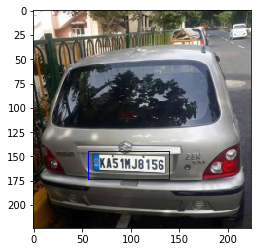

In [12]:
show_img(5)

I created an `ImageDataGenerator` object from Keras to load batches of images to memory. This process is necessary because we do not have infinite memory in both RAM and GPU RAM. I splitted the data into two with a batch size of 32 images. One for training (80% of the data) and one for validation (20% of the data) during training. Validation is important to see if the model overfit to the training data.

## The Model

In [13]:
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.1)

train_generator = datagen.flow_from_dataframe(
    reduced_df,
    directory="Indian Number Plates/",
    x_col="image_name",
    y_col=["top_x", "top_y", "bottom_x", "bottom_y"],
    target_size=(WIDTH, HEIGHT),
    batch_size=32, 
    class_mode="other",
    subset="training")

validation_generator = datagen.flow_from_dataframe(
    reduced_df,
    directory="Indian Number Plates/",
    x_col="image_name",
    y_col=["top_x", "top_y", "bottom_x", "bottom_y"],
    target_size=(WIDTH, HEIGHT),
    batch_size=32, 
    class_mode="other",
    subset="validation")

Found 209 validated image filenames.
Found 23 validated image filenames.


In [21]:
!wget --header="Host: medusa.fit.vutbr.cz" --header="User-Agent: Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/78.0.3904.108 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header="Accept-Language: en-GB,en-US;q=0.9,en;q=0.8" --header="Referer: https://medusa.fit.vutbr.cz/traffic/research-topics/general-traffic-analysis/holistic-recognition-of-low-quality-license-plates-by-cnn-using-track-annotated-data-iwt4s-avss-2017/" --header="Cookie: lana_downloads_manager=eyJkb3dubG9hZF9pZCI6NTEzfQ%3D%3D" --header="Connection: keep-alive" "https://medusa.fit.vutbr.cz/traffic/download/512/" -O "2017-IWT4S-CarsReId_LP-dataset.zip" -c

--2019-12-06 14:55:57--  https://medusa.fit.vutbr.cz/traffic/download/512/
Resolving medusa.fit.vutbr.cz (medusa.fit.vutbr.cz)... 147.229.8.49, 2001:67c:1220:808::93e5:831
Connecting to medusa.fit.vutbr.cz (medusa.fit.vutbr.cz)|147.229.8.49|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1908808499 (1.8G) [application/octet-stream]
Saving to: ‘2017-IWT4S-CarsReId_LP-dataset.zip’

2017-IWT4S-CarsReId 100%[===================>]   1.78G   106MB/s    in 17s     

2019-12-06 14:56:16 (107 MB/s) - ‘2017-IWT4S-CarsReId_LP-dataset.zip’ saved [1908808499/1908808499]



In [22]:
!unzip /content/2017-IWT4S-CarsReId_LP-dataset.zip

Archive:  /content/2017-IWT4S-CarsReId_LP-dataset.zip
  inflating: README.txt              
   creating: s01_l01/
  inflating: s01_l01/1000_1.png      
  inflating: s01_l01/1000_10.png     
  inflating: s01_l01/1000_11.png     
  inflating: s01_l01/1000_12.png     
  inflating: s01_l01/1000_13.png     
  inflating: s01_l01/1000_14.png     
  inflating: s01_l01/1000_15.png     
  inflating: s01_l01/1000_16.png     
  inflating: s01_l01/1000_17.png     
  inflating: s01_l01/1000_18.png     
  inflating: s01_l01/1000_19.png     
  inflating: s01_l01/1000_2.png      
  inflating: s01_l01/1000_20.png     
  inflating: s01_l01/1000_21.png     
  inflating: s01_l01/1000_22.png     
  inflating: s01_l01/1000_23.png     
  inflating: s01_l01/1000_24.png     
  inflating: s01_l01/1000_25.png     
  inflating: s01_l01/1000_26.png     
  inflating: s01_l01/1000_27.png     
  inflating: s01_l01/1000_28.png     
  inflating: s01_l01/1000_29.png     
  inflating: s01_l01/1000_3.png      
  inflating:

I created a relatively "not so deep" convolutional neural network. It have 8 convolutinal layers with 4 max pool layers and a fully connected network with 2 hidden layers.

In [14]:
model = Sequential()
model.add(VGG16(weights="imagenet", include_top=False, input_shape=(HEIGHT, WIDTH, CHANNEL)))
model.add(Flatten())
model.add(Dense(128, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(64, activation="relu"))
model.add(Dense(4, activation="sigmoid"))

model.layers[-6].trainable = False

model.summary()





58892288/58889256 [==============================] - 3s 0us/step






Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               3211392   
_________________________________________________________________
dense_2 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_3 (Dense)              (None, 64)                4160      
_________________________________________________________________
dense_4 (Dense)              (None, 4)                 260       
Total params: 17,938,756
Trainable params: 3,

To find the minimum amount of step count to cover all the batches, the following equations are necessary. Mathematically;

$$
\text{Step size} = \lceil \frac{\text{Number of elements}}{\text{Batch Size}} \rceil
$$

In [15]:

STEP_SIZE_TRAIN = int(np.ceil(train_generator.n / train_generator.batch_size))
STEP_SIZE_VAL = int(np.ceil(validation_generator.n / validation_generator.batch_size))

print("Train step size:", STEP_SIZE_TRAIN)
print("Validation step size:", STEP_SIZE_VAL)

train_generator.reset()
validation_generator.reset()

Train step size: 7
Validation step size: 1


## Training

I used Adam to optimize the weights and mean squared error as my loss function.

In [16]:
adam = Adam(lr=0.0005)
model.compile(optimizer=adam, loss="mse")

In [17]:
history = model.fit_generator(train_generator,
    steps_per_epoch=STEP_SIZE_TRAIN,
    validation_data=validation_generator,
    validation_steps=STEP_SIZE_VAL,
    epochs=100)



Epoch 1/100
7/7 [==============================] - 14s 2s/step - loss: 0.0341 - val_loss: 0.0242
Epoch 2/100
7/7 [==============================] - 2s 316ms/step - loss: 0.0110 - val_loss: 0.0167
Epoch 3/100
7/7 [==============================] - 2s 317ms/step - loss: 0.0067 - val_loss: 0.0125
Epoch 4/100
7/7 [==============================] - 2s 325ms/step - loss: 0.0038 - val_loss: 0.0130
Epoch 5/100
7/7 [==============================] - 2s 328ms/step - loss: 0.0026 - val_loss: 0.0124
Epoch 6/100
7/7 [==============================] - 2s 338ms/step - loss: 0.0017 - val_loss: 0.0144
Epoch 7/100
7/7 [==============================] - 2s 327ms/step - loss: 0.0013 - val_loss: 0.0131
Epoch 8/100
7/7 [==============================] - 2s 326ms/step - loss: 8.9910e-04 - val_loss: 0.0132
Epoch 9/100
7/7 [==============================] - 2s 329ms/step - loss: 6.9823e-04 - val_loss: 0.0126
Epoch 10/100
7/7 [==============================] - 2s 331ms/step - loss: 5.3850e-04 - val_loss: 0.01

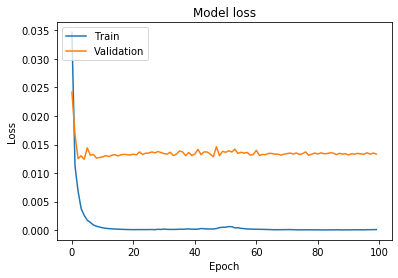

In [18]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

The model's success over the validation data is 80%. However, you can see that from the above figure, the training is stopped after 30th epoch. This may because of the low number of training samples or my model is not capable of learning such data. If you have an idea, please comment below.

## Tests

In [19]:
model.evaluate_generator(validation_generator, steps=STEP_SIZE_VAL)

0.013334108516573906

Remember that, we had picked five lucky test samples for visiual inspection. Here they are.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


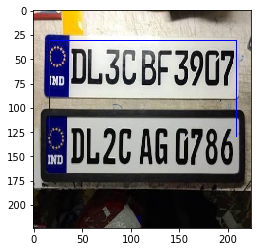

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


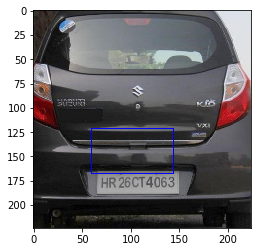

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


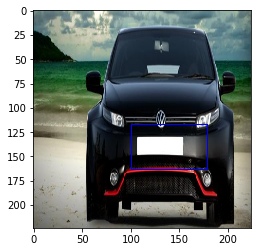

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


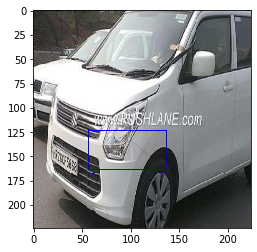

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


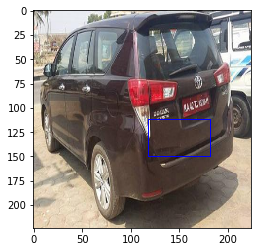

In [20]:
for idx, row in df.iloc[lucky_test_samples].iterrows():    
    img = cv2.resize(cv2.imread("Indian Number Plates/" + row[0]) / 255.0, dsize=(WIDTH, HEIGHT))
    y_hat = model.predict(img.reshape(1, WIDTH, HEIGHT, 3)).reshape(-1) * WIDTH
    
    xt, yt = y_hat[0], y_hat[1]
    xb, yb = y_hat[2], y_hat[3]
    
    img = cv2.cvtColor(img.astype(np.float32), cv2.COLOR_BGR2RGB)
    image = cv2.rectangle(img, (xt, yt), (xb, yb), (0, 0, 255), 1)
    plt.imshow(image)
    plt.show()

# Conclusion
The model defined above is a very simple toy model. The training is straightforward and tests may not be reliable since the dataset is so small. However, it proves a concept that you can find plates from images with a simple CNN. This network may be used as a part of other more complicated networks.

Thank you :)